In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"

using MLJ, SPI
using Distances
using StatsPlots, StatsBase
using Muon, CSV, DataFrames

Rita's consortia

* MSK.1.10
* MSK.19.28
* MSK.20.34
* MSK.7.21
* MSK.7.7

In [43]:
rdir = datadir("exp_pro", "BB728") |> mkpath
pdir = plotsdir("CSB_consortia") |> mkpath
biobank = readh5mu(joinpath(rdir, "BB728.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/ben/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 728 ✕ 21485
└ metabolites_foldchange
  AnnData object 728 ✕ 50
└ metabolites_millimolar
  AnnData object 728 ✕ 10
└ UPorder_oggs
  AnnData object 728 ✕ 10177
└ oggs
  AnnData object 728 ✕ 11248

In [5]:
ritas5 = [
    "MSK.1.10",
    "MSK.19.28",
    "MSK.20.34",
    "MSK.7.21",
    "MSK.7.7",
]

5-element Vector{String}:
 "MSK.1.10"
 "MSK.19.28"
 "MSK.20.34"
 "MSK.7.21"
 "MSK.7.7"

In [6]:
indexin(ritas5, biobank.obs_names)

5-element Vector{Union{Nothing, Int64}}:
    nothing
    nothing
    nothing
 189
 188

In [19]:
r = -1:.001:1
f(x, y) = sqrt(sum(abs2.([x, y]))) < 1.
f1(x, y, z) = sqrt(sum(abs2.([x, y, z]))) < 1.

f1 (generic function with 1 method)

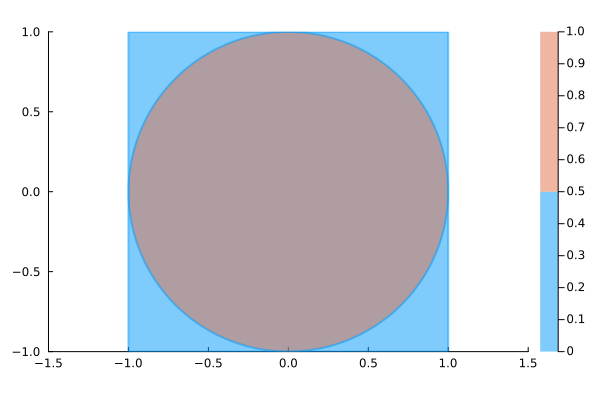

In [23]:
contour(r,r,f, f=true, c=[1,2], 
    nlev=1, ratio=1, alpha=.5, lw=2, grid=false)

In [24]:
Dij_ew = biobank[:UPorder_oggs].obsp["SDij_earlywindow"][:,:]
Dij_mw = biobank[:UPorder_oggs].obsp["SDij_middlewindow"][:,:]
Dij_lw = biobank[:UPorder_oggs].obsp["SDij_latewindow"][:,:];

In [25]:
inBB673 = biobank.obs.inBB673 .== 1;

In [26]:
train_uppertri = triu(trues(sum(inBB673), sum(inBB673)), 1)
test_uppertri = triu(trues(sum(.!inBB673), sum(.!inBB673)), 1);

In [27]:
biobank

MuData object 728 ✕ 21485
└ metabolites_foldchange
  AnnData object 728 ✕ 50
└ metabolites_millimolar
  AnnData object 728 ✕ 10
└ UPorder_oggs
  AnnData object 728 ✕ 10177
└ oggs
  AnnData object 728 ✕ 11248

In [28]:
bbmM = biobank["metabolites_millimolar"].X[:, 1:4];

In [29]:
traindf = DataFrame(
    :earlywindowdist => Dij_ew[inBB673, inBB673][train_uppertri],
    :middlewindowdist => Dij_mw[inBB673, inBB673][train_uppertri],
    :latewindowdist => Dij_lw[inBB673, inBB673][train_uppertri],
    :samephylum => (biobank.obs.phylum .== permutedims(biobank.obs.phylum))[inBB673, inBB673][train_uppertri],
    :samefamily => (biobank.obs.family .== permutedims(biobank.obs.family))[inBB673, inBB673][train_uppertri],
    :samespecies=> (biobank.obs.species .== permutedims(biobank.obs.species))[inBB673, inBB673][train_uppertri],
    :samedonor => (biobank.obs.donor .== permutedims(biobank.obs.donor))[inBB673, inBB673][train_uppertri],
    :metdist => Distances.pairwise(Euclidean(), bbmM')[inBB673, inBB673][train_uppertri],
);

In [30]:
sample()

sample (generic function with 14 methods)

In [54]:
strndf = traindf[sample(1:nrows(traindf), 2000, replace=false), :];

┌ Info: Saved animation to /Users/ben/projects/Doran_etal_2022/plots/CSB_consortia/anim_fps15.gif
└ @ Plots /Users/ben/.julia/packages/Plots/Pn7Zn/src/animation.jl:149


Plots.AnimatedGif("/Users/ben/projects/Doran_etal_2022/plots/CSB_consortia/anim_fps15.gif")
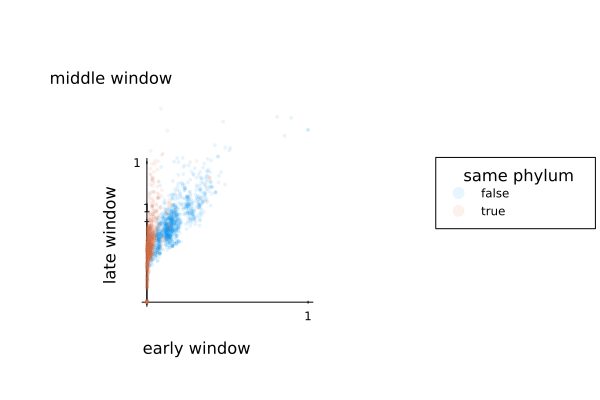

In [70]:
anim = @animate for a in 0:355
    @df strndf scatter(
        :earlywindowdist / maximum(:earlywindowdist), 
        :middlewindowdist / maximum(:middlewindowdist), 
        :latewindowdist / maximum(:latewindowdist), 
        group=:samephylum,
        camera=(a, 30),
        framestyle=:origin,
        ymirror=true,
        ticks=[0,1],
        xlabel="early window",
        ylabel="middle window",
        zlabel="late window",
        legendtitle="same phylum",
        grid=false,
        legend=:outerright,
        margin=5Plots.Measures.mm,
        alpha=.1, markersize=2, markerstrokewidth=0,
    )
end
gif(anim, joinpath(pdir, "anim_fps15.gif"), fps = 15)

┌ Info: Saved animation to /Users/ben/projects/Doran_etal_2022/plots/CSB_consortia/anim_species_fps15.gif
└ @ Plots /Users/ben/.julia/packages/Plots/Pn7Zn/src/animation.jl:149


Plots.AnimatedGif("/Users/ben/projects/Doran_etal_2022/plots/CSB_consortia/anim_species_fps15.gif")
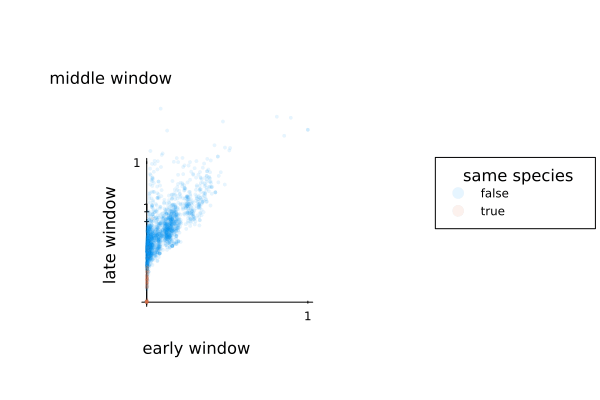

In [72]:
anim = @animate for a in 0:355
    @df strndf scatter(
        :earlywindowdist / maximum(:earlywindowdist), 
        :middlewindowdist / maximum(:middlewindowdist), 
        :latewindowdist / maximum(:latewindowdist), 
        group=:samespecies,
        camera=(a, 30),
        framestyle=:origin,
        ymirror=true,
        ticks=[0,1],
        xlabel="early window",
        ylabel="middle window",
        zlabel="late window",
        legendtitle="same species",
        grid=false,
        legend=:outerright,
        margin=5Plots.Measures.mm,
        alpha=.1, markersize=2, markerstrokewidth=0,
    )
end
gif(anim, joinpath(pdir, "anim_species_fps15.gif"), fps = 15)

┌ Info: Saved animation to /Users/ben/projects/Doran_etal_2022/plots/CSB_consortia/anim_donor_fps15.gif
└ @ Plots /Users/ben/.julia/packages/Plots/Pn7Zn/src/animation.jl:149


Plots.AnimatedGif("/Users/ben/projects/Doran_etal_2022/plots/CSB_consortia/anim_donor_fps15.gif")
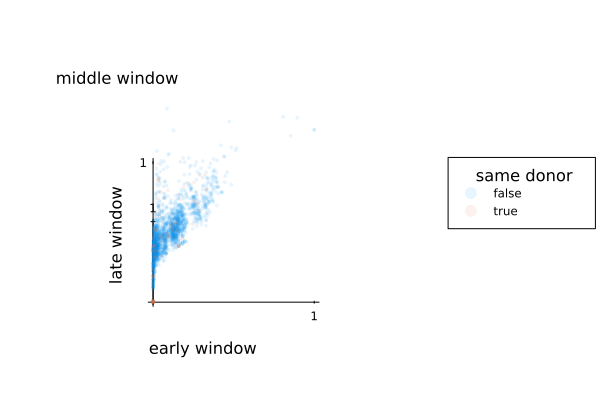

In [73]:
anim = @animate for a in 0:355
    @df strndf scatter(
        :earlywindowdist / maximum(:earlywindowdist), 
        :middlewindowdist / maximum(:middlewindowdist), 
        :latewindowdist / maximum(:latewindowdist), 
        group=:samedonor,
        camera=(a, 30),
        framestyle=:origin,
        ymirror=true,
        ticks=[0,1],
        xlabel="early window",
        ylabel="middle window",
        zlabel="late window",
        legendtitle="same donor",
        grid=false,
        legend=:outerright,
        margin=5Plots.Measures.mm,
        alpha=.1, markersize=2, markerstrokewidth=0,
    )
end
gif(anim, joinpath(pdir, "anim_donor_fps15.gif"), fps = 15)

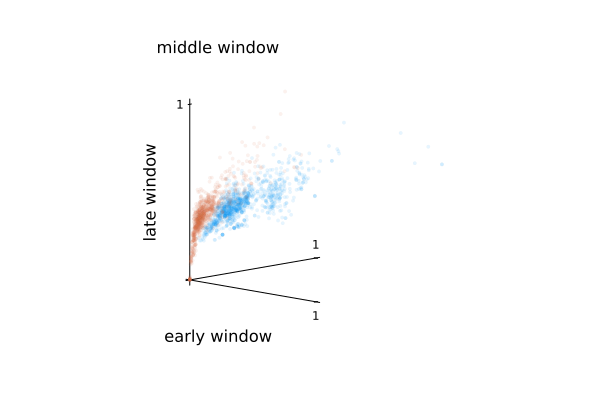

In [69]:
@df strndf scatter(
        :earlywindowdist / maximum(:earlywindowdist), 
        :middlewindowdist / maximum(:middlewindowdist), 
        :latewindowdist / maximum(:latewindowdist), 
        group=:samephylum,
        camera=(45, 10),
        framestyle=:origin,
        ymirror=true,
        ticks=[0,1],
        xlabel="early window",
        ylabel="middle window",
        zlabel="late window",
        legendtitle="same phylum",
        grid=false,
        legend=:none,
        alpha=.1, markersize=2, markerstrokewidth=0,
    )

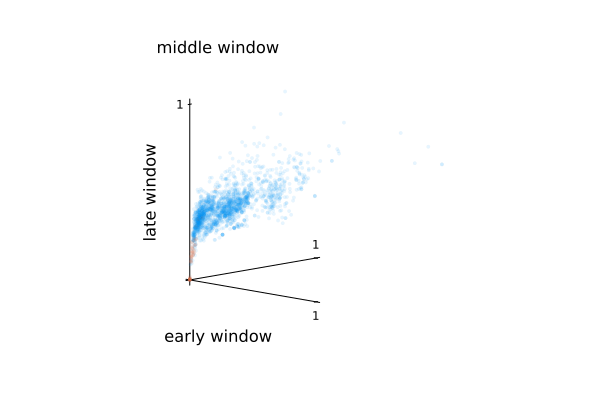

In [74]:
@df strndf scatter(
        :earlywindowdist / maximum(:earlywindowdist), 
        :middlewindowdist / maximum(:middlewindowdist), 
        :latewindowdist / maximum(:latewindowdist), 
        group=:samespecies,
        camera=(45, 10),
        framestyle=:origin,
        ymirror=true,
        ticks=[0,1],
        xlabel="early window",
        ylabel="middle window",
        zlabel="late window",
        legendtitle="same species",
        grid=false,
        legend=:none,
        alpha=.1, markersize=2, markerstrokewidth=0,
    )

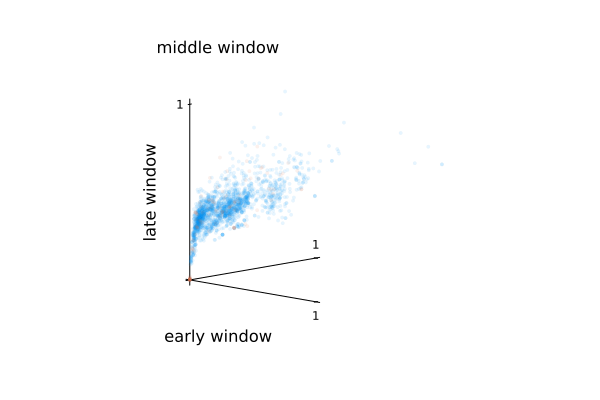

In [75]:
@df strndf scatter(
        :earlywindowdist / maximum(:earlywindowdist), 
        :middlewindowdist / maximum(:middlewindowdist), 
        :latewindowdist / maximum(:latewindowdist), 
        group=:samedonor,
        camera=(45, 10),
        framestyle=:origin,
        ymirror=true,
        ticks=[0,1],
        xlabel="early window",
        ylabel="middle window",
        zlabel="late window",
        legendtitle="same donor",
        grid=false,
        legend=:none,
        alpha=.1, markersize=2, markerstrokewidth=0,
    )